In [83]:
from rdkit import Chem
from rdkit.Chem.Draw import IPythonConsole
import rdkit
import pandas as pd
from pathlib import Path
import numpy as np

In [84]:
pip install prism_pruner

Note: you may need to restart the kernel to use updated packages.


In [85]:
#from prism_pruner.conformer_ensemble import ConformerEnsemble
#from prism_pruner.pruner import prune
#
#ensemble = ConformerEnsemble.from_xyz("/home/henryteahan/Projects/Orca_workflow/Automated/isomer1.xyz")
#
#ensemble.coords.shape # (1086, 136, 3)
#
#pruned, mask = prune(
#    ensemble.coords,
#    ensemble.atoms,
#
#    # the third pruning routine can be
#    # slow and is often not necessary,
#    # so it's off by default
#    rot_corr_rmsd_pruning=False,
#
#    debugfunction=print,
#)
#
#pruned.shape # (387, 136, 3)
#mask.shape # (1086,)
## where pruned is ensemble.coords[mask]

In [121]:
combined_frame = pd.read_csv("~/Projects/Orca_workflow/Automated/smiles.csv")
mols = [Chem.MolFromSmiles(s) for s in combined_frame['smiles_huckel_DFT_xyz']]

In [122]:
print("Number of complexes", len(mols))

Number of complexes 45727


# Beginning of my code

In [123]:
from rdkit.Chem.MolStandardize import rdMolStandardize

params = Chem.MolStandardize.rdMolStandardize.MetalDisconnectorOptions()
params.splitAromaticC = True
params.splitGrignards = True
params.adjustCharges = False
mdis = rdMolStandardize.MetalDisconnector(params)

[10:52:38] Initializing MetalDisconnector


IDEA: First: Make sure the ligand is bidentate.
    -> 1. Get number of neighbours to central atom (and get the atoms that are bonded to it)
    -> 2. Get the fragments - if a fragment contains 2 of the atom idx that are bonded to the central atom -> Extract that ligand
    -> 1. Check number of bonds between each fragment and the central metal ion. 
    -> If none == 2; continue

 Take the complex, run metal disconnector. Store the disconnected bonds. Make molobjects of the ligands. Rejoin them at the atoms that previously were broken.

In [89]:
TRANSITION_METALS_NUM = [21,22,23,24,25,26,27,57,28,29,30,39,40,41,42,43,44,45,46,47,48,71,72,73,74,75,76,77,78,79,80]

In [150]:
from rdkit import Chem
import pandas as pd
import argparse
from rdkit.Chem.MolStandardize import rdMolStandardize
import re
### END
def identify_bidentate(mol, TRANSITION_METALS_NUM, mdis):
    """
    Identifies bidentate ligands by fragmenting the complex, and counting number of bonds to the central metal ion -> If a ligand has two bonds: bidentate
    """
    map = 0
    neighbours = 0
    
    # Find the central metal ion; and enumerate the atoms using rdkit atom props -> Consistent through splitting.
    for atom in mol.GetAtoms():
        atom.SetIntProp("map", map)
        map += 1
        if atom.GetAtomicNum() in TRANSITION_METALS_NUM:
            neighbours = atom.GetNeighbors()
        else:
            continue

    if neighbours == 0:
        return -1 #TODO: Make this into a valueerror handling
    
    neighbours = [n.GetIdx() for n in neighbours]
    
    # Begin fragmenting
    out = mdis.Disconnect(mol)
    frags = []
    for f in Chem.GetMolFrags(out, asMols=True, fragsMolAtomMapping=[]):
        frags += [f]

    bidentate_idx = []
    for i, m in enumerate(frags):
        # Count how many bonds each fragment has to the central metal ion
        count = 0
        for atom in m.GetAtoms():
            if int(atom.GetProp("map")) in neighbours:
                count += 1
                atom.SetIntProp("binding_site", 1)
        if count == 2:
            bidentate_idx.append(i)
    if len(bidentate_idx) == 1:
        return frags[bidentate_idx[0]]
    elif len(bidentate_idx) > 1:
        return [frags[b_idx] for b_idx in bidentate_idx]
    else:
        return -1

def highlight_bindsite(mol):
    """
    Finds the binding sites and returns the atom indexes -> Used to rejoin the molecules after!        
    """
    highlight_atoms = []
    for atom in mol.GetAtoms():
        if atom.HasProp("binding_site"):
            if int(atom.GetProp("binding_site")) != 0:  
                highlight_atoms.append(atom.GetIdx())
    return highlight_atoms

def remove_duplicate_mols(ligands, ligand_highlight):
    """
    Finds and removes duplicate mols if they exist. Uses canonical smiles and CanonicalRankAtoms to create identifier hash (smi_bind).
    """
    seen = set()
    bindsites = []
    unique_mols = []
    
    for high, mol in zip(ligand_highlight, ligands):
        ranks = Chem.CanonicalRankAtoms(mol)
        site_ranks = sorted(ranks[idx] for idx in high)
        try:
            smi = Chem.MolToSmiles(mol, canonical=True)
        except:
            unique_mols.append(-1)
            bindsites.append(None)
            continue
        smi_bind = f"{smi}{tuple(site_ranks)}"
      #  print(smi_bind, high)
        if smi_bind not in seen:
            seen.add(smi_bind)
            unique_mols.append(mol)
            bindsites.append(high)
    return unique_mols, bindsites

pt = Chem.GetPeriodicTable()
def rejoin_mols(ligands, right_side):
    """
    Joins the ligand and the right side of the molecule.
    Preserves ligand order during failure.
    """
    mols = []
    smiles = []

   # right_side = Chem.MolFromSmiles(right_side)

    for ligand in ligands:
        try:
            # Default failure
            mols.append(-1)
            smiles.append(-1)
            #
            Chem.Kekulize(ligand)

            # Combine ligand and isomer
            comb = Chem.CombineMols(right_side, ligand)
            edcombo = Chem.EditableMol(comb)
            b_idx = []
            rem_idx = []
            m_idx = -1

            for atom in comb.GetAtoms():
                if atom.GetAtomicNum() == 28: #TODO: Assumes use of Ni metal 
                    m_idx = atom.GetIdx()
                    continue # Skip central metal ion

                if atom.HasProp("binding_site"):
                    b_idx.append(atom.GetIdx()) # Append if binding site    
                    valence = atom.GetTotalValence()
                    norm_valence = pt.GetDefaultValence(atom.GetAtomicNum())
                    remaining = norm_valence - valence
                    rem_idx.append(remaining)
                    
                    
            if m_idx == -1 or not b_idx:
                continue
                
            for rem, val in zip(rem_idx, b_idx):
                if rem >= 1:
                    edcombo.AddBond(val, m_idx, order=Chem.BondType.SINGLE)
                else:
                    edcombo.AddBond(val, m_idx, order=Chem.BondType.DATIVE)
            
            
            f = edcombo.GetMol()

            for atom in f.GetAtoms():
                if atom.HasProp("binding_site"):
                    atom.SetFormalCharge(0)

            s = Chem.MolToSmiles(f, canonical=True)
            
            smiles[-1] = s
            mols[-1] = f
        except:
            print("Error")
            continue
    return mols, smiles



def parse_rejoined_mols(ligands, right_side):
    if isinstance(right_side, list):
        right_side = [Chem.MolFromSmiles(r) for r in right_side]
    else:
        right_side = Chem.MolFromSmiles(right_side)
    output, smiles_output = rejoin_mols(ligands, right_side)
    print(output, smiles_output)
    #output = [t for t in output if type(t) != int]
    smiles_output = []
    clean_mols = []
    for i, m in enumerate(output):
        try:
            for atom in m.GetAtoms():
                num_radicals = atom.GetNumRadicalElectrons() # REMOVE RANDOM RADICALS LEFT OVER
                if num_radicals:
                    atom.SetNumExplicitHs(atom.GetNumExplicitHs() + 1)
                    atom.SetNumRadicalElectrons(0)
            m.UpdatePropertyCache()
            Chem.AddHs(m)
            Chem.SanitizeMol(m)
            smiles_output.append(Chem.MolToSmiles(m))
            clean_mols.append(m)
        except:
            smiles_output.append(-1)
            clean_mols.append(-1)
            #print("FAILED", i)
            continue
    successful_smiles = [s for s in smiles_output if type(s) != int] 
    print(f"Succesfully parsed {len(smiles_output)} mols ({len(smiles_output)/len(ligands)*100:.2f}%)")
    return smiles_output, clean_mols

In [139]:
mols = mols[:100]

In [155]:
# Extract bidentate ligands
ligands = []
mol_id = []
for i, mol in enumerate(mols):
    frag = identify_bidentate(mol, TRANSITION_METALS_NUM, mdis)
    if frag != -1: # identify_bidentate returns -1 if it cannot find a bidentate ligand or if it errors.
        if isinstance(frag,list):
            for f in frag:
                f.SetIntProp("ID", i)
                ligands.append(f)
                mol_id.append(i)
        else:
            frag.SetIntProp("ID", i) # Ligand identifier
            ligands.append(frag)
            mol_id.append(i)
print("Found this many bidentate ligands!!", len(ligands))
# END

# Parse extracted bidentate ligands
ligand_highlight = []
ligands_flattened = []
for n, mol in enumerate(ligands):
    #if isinstance(mol, list): # Capture cases where complex has >1 bidentate ligands
    #    for m in mol:
    #        highlight_atoms = highlight_bindsite(m) # Extracts binding site set by identify_bidentate
    #        ligand_highlight.append(highlight_atoms)
    #        ligands_flattened.append(m)
    #else:
    highlight_atoms = highlight_bindsite(mol)
    ligand_highlight.append(highlight_atoms)
    ligands_flattened.append(mol)
# END

# Remove duplicate ligands
ligands, bindsites = remove_duplicate_mols(ligands_flattened, ligand_highlight)
print("Number of unique mols", len(ligands))
smiles_of_ligands = [Chem.MolToSmiles(l) for l in ligands]
# END
# TODO: Initiate the df here!
df = pd.DataFrame()
df['ligand_ID'] = [l.GetProp("ID") for l in ligands]
df['ligands'] = ligands
df['bind_site'] = bindsites
 

new_smiles, new_mols = parse_rejoined_mols(ligands, central_metal)
# END
df[f'smiles_{id}'] = new_smiles
# END
## NOTE: smiles and ligands_smiles now contain ligand, smile pairs.
#df = df[df['smiles_0'] != "-1"]#
#df = df[df['smiles_0'] != -1]
#df.to_csv("smiles_out.csv")
print("Saved smiles_out.csv with the complexes for screening")

Found this many bidentate ligands!! 53
Number of unique mols 32
[<rdkit.Chem.rdchem.Mol object at 0x7fd625fd5af0>, <rdkit.Chem.rdchem.Mol object at 0x7fd6264955b0>, <rdkit.Chem.rdchem.Mol object at 0x7fd6260cc200>, <rdkit.Chem.rdchem.Mol object at 0x7fd6260cda80>, <rdkit.Chem.rdchem.Mol object at 0x7fd6260ce9d0>, <rdkit.Chem.rdchem.Mol object at 0x7fd6260cfca0>, <rdkit.Chem.rdchem.Mol object at 0x7fd6260cfe60>, <rdkit.Chem.rdchem.Mol object at 0x7fd62648adc0>, <rdkit.Chem.rdchem.Mol object at 0x7fd62649be60>, <rdkit.Chem.rdchem.Mol object at 0x7fd62649b4c0>, <rdkit.Chem.rdchem.Mol object at 0x7fd62649bed0>, <rdkit.Chem.rdchem.Mol object at 0x7fd62649b3e0>, <rdkit.Chem.rdchem.Mol object at 0x7fd62649b920>, <rdkit.Chem.rdchem.Mol object at 0x7fd626498970>, <rdkit.Chem.rdchem.Mol object at 0x7fd626498510>, <rdkit.Chem.rdchem.Mol object at 0x7fd626499d90>, <rdkit.Chem.rdchem.Mol object at 0x7fd62649a0a0>, <rdkit.Chem.rdchem.Mol object at 0x7fd62649e420>, <rdkit.Chem.rdchem.Mol object at 0x

[12:44:56] Running MetalDisconnector
[12:44:56] Removed covalent bond between Pd and O
[12:44:56] Removed covalent bond between Pd and O
[12:44:56] Removed covalent bond between Pd and N
[12:44:56] Removed covalent bond between Pd and N
[12:44:56] Running MetalDisconnector
[12:44:56] Removed covalent bond between Pd and N
[12:44:56] Removed covalent bond between Pd and N
[12:44:56] Removed covalent bond between Pd and Cl
[12:44:56] Removed covalent bond between Pd and Cl
[12:44:56] Running MetalDisconnector
[12:44:56] Removed covalent bond between Pd and N
[12:44:56] Removed covalent bond between Pd and N
[12:44:56] Removed covalent bond between Pd and Cl
[12:44:56] Removed covalent bond between Pd and Cl
[12:44:56] Running MetalDisconnector
[12:44:56] Removed covalent bond between Ni and N
[12:44:56] Removed covalent bond between Ni and N
[12:44:56] Removed covalent bond between Ni and N
[12:44:56] Removed covalent bond between Ni and N
[12:44:56] Removed covalent bond between Ni and 

In [156]:
df

,ligand_ID,ligands,bind_site,smiles_<built-in function id>
0,0,<rdkit.Chem.rdchem.Mol object at 0x7fd6253af680>,"[12, 13]",Cc1cc2ccccc2c2c1[O][Ni]1([O]C(=O)C(c3ccccc3)[N...
1,0,<rdkit.Chem.rdchem.Mol object at 0x7fd6253aec70>,"[0, 4]",C[N]1(CC[N](C)(Cc2ccccc2)->[Ni]<-12[O]C(=O)C(c...
2,2,<rdkit.Chem.rdchem.Mol object at 0x7fd6253ac970>,"[1, 4]",C[N]1(CC[N](C)(Cc2c3ccccc3cc3ccccc23)->[Ni]<-1...
3,12,<rdkit.Chem.rdchem.Mol object at 0x7fd6253ac2e0>,"[0, 19]",O=C1[O][Ni]2(<-[P](c3ccccc3)(c3ccccc3)c3ccccc3...
4,17,<rdkit.Chem.rdchem.Mol object at 0x7fd6253ad620>,"[5, 14]",CC1=CC(C)=[N](c2c(C)cccc2C)->[Ni]2([N]1c1c(C)c...
5,19,<rdkit.Chem.rdchem.Mol object at 0x7fd6253ae9d0>,"[6, 9]",CC1=C(C)C(C)([Si]2(Cl)(->[Hg+2]<-[Cl][Ni]23[O]...
6,21,<rdkit.Chem.rdchem.Mol object at 0x7fd6253afed0>,"[0, 7]",O=C1[O][Ni]2([NH]c3ccccc3[NH]2)[N](c2ccccc2)C1...
7,22,<rdkit.Chem.rdchem.Mol object at 0x7fd6253af220>,"[3, 4]",CC1(C)[CH2][Ni]2([CH2]c3ccccc31)[O]C(=O)C(c1cc...
8,24,<rdkit.Chem.rdchem.Mol object at 0x7fd6253af7d0>,"[8, 16]",CC(c1ccccc1)[N]1=Cc2ccccc2[O][Ni]<-12[O]C(=O)C...
9,24,<rdkit.Chem.rdchem.Mol object at 0x7fd625fd5930>,"[0, 13]",O=C1[O][Ni]2([c]3cc(F)cc(F)c3-c3cccc[n]->23)[N...


In [90]:
def identify_bidentate(mol, TRANSITION_METALS_NUM, mdis):
    """
    Identifies bidentate ligands by fragmenting the complex, and counting number of bonds to the central metal ion -> If a ligand has two bonds: bidentate
    """
    map = 0
    neighbours = 0
    
    # Find the central metal ion; and enumerate the atoms using rdkit atom props -> Consistent through splitting.
    for atom in mol.GetAtoms():
        atom.SetIntProp("map", map)
        map += 1
        if atom.GetAtomicNum() in TRANSITION_METALS_NUM:
            neighbours = atom.GetNeighbors()
        else:
            continue

    if neighbours == 0:
        return -1 #TODO: Make this into a valueerror handling
    
    neighbours = [n.GetIdx() for n in neighbours]
    
    # Begin fragmenting
    out = mdis.Disconnect(mol)
    frags = []
    for f in Chem.GetMolFrags(out, asMols=True, fragsMolAtomMapping=[]):
        frags += [f]

    bidentate_idx = []
    for i, m in enumerate(frags):
        # Count how many bonds each fragment has to the central metal ion
        count = 0
        for atom in m.GetAtoms():
            if int(atom.GetProp("map")) in neighbours:
                count += 1
                atom.SetIntProp("binding_site", 1)
        if count == 2:
            bidentate_idx.append(i)
    if len(bidentate_idx) == 1:
        return frags[bidentate_idx[0]]
    elif len(bidentate_idx) > 1:
        return [frags[b_idx] for b_idx in bidentate_idx]
    else:
        return -1

In [91]:
ligands = []
mol_id = []
for i, mol in enumerate(mols):
    frag = identify_bidentate(mol, TRANSITION_METALS_NUM, mdis)
    if frag != -1:
        ligands.append(frag)
        mol_id.append(i)


[10:15:04] Running MetalDisconnector
[10:15:04] Removed covalent bond between Pd and O
[10:15:04] Removed covalent bond between Pd and O
[10:15:04] Removed covalent bond between Pd and N
[10:15:04] Removed covalent bond between Pd and N
[10:15:04] Running MetalDisconnector
[10:15:04] Removed covalent bond between Pd and N
[10:15:04] Removed covalent bond between Pd and N
[10:15:04] Removed covalent bond between Pd and Cl
[10:15:04] Removed covalent bond between Pd and Cl
[10:15:04] Running MetalDisconnector
[10:15:04] Removed covalent bond between Pd and N
[10:15:04] Removed covalent bond between Pd and N
[10:15:04] Removed covalent bond between Pd and Cl
[10:15:04] Removed covalent bond between Pd and Cl
[10:15:04] Running MetalDisconnector
[10:15:04] Removed covalent bond between Ni and N
[10:15:04] Removed covalent bond between Ni and N
[10:15:04] Removed covalent bond between Ni and N
[10:15:04] Removed covalent bond between Ni and N
[10:15:04] Removed covalent bond between Ni and 

In [92]:
print("Found this many bidentate ligands!!", len(ligands))

Found this many bidentate ligands!! 20457


Number of unique mols 9938


/home/henryteahan/miniconda3/envs/orca/lib/python3.12/site-packages/rdkit/Chem/Draw/IPythonConsole.py:365: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


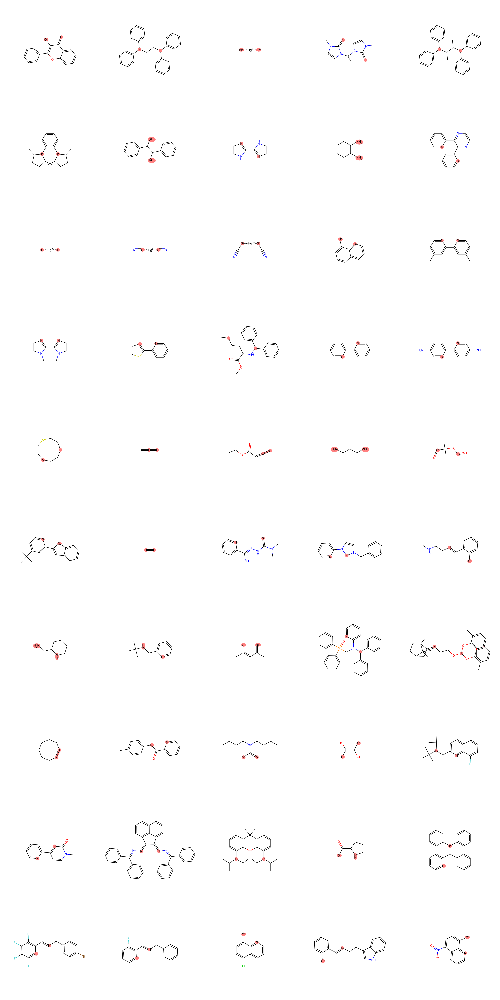

In [ ]:
def highlight_bindsite(mol):
    """
    Finds the binding sites and returns the atom indexes -> Used to rejoin the molecules after!        
    """
    highlight_atoms = []
    for atom in mol.GetAtoms():
        if atom.HasProp("binding_site"):
            if int(atom.GetProp("binding_site")) != 0:  
                highlight_atoms.append(atom.GetIdx())
    return highlight_atoms

def remove_duplicate_mols(ligands, ligand_highlight):
    """
    Finds and removes duplicate mols if they exist. Uses canonical smiles and CanonicalRankAtoms to create identifier hash (smi_bind).
    """
    seen = set()
    bindsites = []
    unique_mols = []
    
    for high, mol in zip(ligand_highlight, ligands):
        ranks = Chem.CanonicalRankAtoms(mol)
        site_ranks = sorted(ranks[idx] for idx in high)
        try:
            smi = Chem.MolToSmiles(mol, canonical=True)
        except:
            continue
        smi_bind = f"{smi}{tuple(site_ranks)}"
      #  print(smi_bind, high)
        if smi_bind not in seen:
            unique_mols.append(mol)
            bindsites.append(high)
    return unique_mols, bindsites

ligand_highlight = []
ligands_flattened = []

for n, mol in enumerate(ligands):
    if isinstance(mol, list):
        for m in mol:
            highlight_atoms = highlight_bindsite(m)
            ligand_highlight.append(highlight_atoms)
            ligands_flattened.append(m)
    else:
        highlight_atoms = highlight_bindsite(mol)
        ligand_highlight.append(highlight_atoms)
        ligands_flattened.append(mol)

#print("number of mols", len(ligands_flattened))

unique_mols, bindsites = remove_duplicate_mols(ligands_flattened, ligand_highlight)

print("Number of unique mols", len(unique_mols))
Chem.Draw.MolsToGridImage(unique_mols[50:], highlightAtomLists=bindsites[50:], molsPerRow=5, subImgSize=(500,500), maxMols=50)


In [94]:
central_metal = "O=C1O[Ni]N(C1C1=CC=CC=C1)C1=CC=CC=C1"

In [95]:
    #print(Chem.MolToSmiles(ligand))
    #Chem.Kekulize(ligand, clearAromaticFlags=True)
    #f#or atom in ligand.GetAtoms():
    #    atom.SetFormalCharge(0)

In [132]:
pt = Chem.GetPeriodicTable()
def rejoin_mols(ligands, right_side):
    """
    Joins the ligand and the right side of the molecule.
    Preserves ligand order during failure.
    """
    mols = []
    smiles = []

    right_side = Chem.MolFromSmiles(right_side)

    for ligand in ligands:
        try:
            # Default failure
            mols.append(-1)
            smiles.append(-1)
            #
            Chem.Kekulize(ligand)

            # Combine ligand and isomer
            comb = Chem.CombineMols(right_side, ligand)
            edcombo = Chem.EditableMol(comb)
            b_idx = []
            rem_idx = []
            m_idx = -1

            for atom in comb.GetAtoms():
                if atom.GetAtomicNum() == 28: #TODO: Assumes use of Ni metal 
                    m_idx = atom.GetIdx()
                    continue # Skip central metal ion

                if atom.HasProp("binding_site"):
                    b_idx.append(atom.GetIdx()) # Append if binding site    
                    valence = atom.GetTotalValence()
                    norm_valence = pt.GetDefaultValence(atom.GetAtomicNum())
                    remaining = norm_valence - valence
                    rem_idx.append(remaining)
                    
                    
            if m_idx == -1 or not b_idx:
                continue
                
            for rem, val in zip(rem_idx, b_idx):
                if rem >= 1:
                    edcombo.AddBond(val, m_idx, order=Chem.BondType.SINGLE)
                else:
                    edcombo.AddBond(val, m_idx, order=Chem.BondType.DATIVE)
            
            
            f = edcombo.GetMol()

            for atom in f.GetAtoms():
                if atom.HasProp("binding_site"):
                    atom.SetFormalCharge(0)

            s = Chem.MolToSmiles(f, canonical=True)
            
            smiles[-1] = s
            mols[-1] = f
        except:
            print("Error")
            continue
    return mols, smiles


In [159]:
def rejoin_mols(ligands, right_side):
    """
    Joins the ligand and the right side of the molecule.
    Preserves ligand order during failure.
    """
    mols = []
    smiles = []

    right_side = Chem.MolFromSmiles(right_side)

    for ligand in ligands:
        try:
            # Default failure
            mols.append(-1)
            smiles.append(-1)
            #
            Chem.Kekulize(ligand)

            # Combine ligand and isomer
            comb = Chem.CombineMols(right_side, ligand)
            edcombo = Chem.EditableMol(comb)
            b_idx = []
            rem_idx = []
            m_idx = -1

            for atom in comb.GetAtoms():
                if atom.GetAtomicNum() == 28: #TODO: Assumes use of Ni metal 
                    m_idx = atom.GetIdx()
                    continue # Skip central metal ion

                if atom.HasProp("binding_site"):
                    b_idx.append(atom.GetIdx()) # Append if binding site    
                    valence = atom.GetTotalValence()
                    norm_valence = pt.GetDefaultValence(atom.GetAtomicNum())
                    remaining = norm_valence - valence
                    rem_idx.append(remaining)
                    
                    
            if m_idx == -1 or not b_idx:
                continue
                
            for rem, val in zip(rem_idx, b_idx):
                if rem >= 1:
                    edcombo.AddBond(val, m_idx, order=Chem.BondType.SINGLE)
                else:
                    edcombo.AddBond(val, m_idx, order=Chem.BondType.DATIVE)
            
            
            f = edcombo.GetMol()

            for atom in f.GetAtoms():
                if atom.HasProp("binding_site"):
                    atom.SetFormalCharge(0)

            s = Chem.MolToSmiles(f, canonical=True)
            
            smiles[-1] = s
            mols[-1] = f
        except:
            print("Error")
            continue
    return mols, smiles

def parse_rejoined_mols(ligands, right_side):
    output, smiles_output = rejoin_mols(ligands, right_side)
    output = [t for t in output if type(t) != int]
    smiles_output = []
    clean_mols = []
    for i, m in enumerate(output):
        try:
            for atom in m.GetAtoms():
                num_radicals = atom.GetNumRadicalElectrons() # REMOVE RANDOM RADICALS LEFT OVER
                if num_radicals:
                    atom.SetNumExplicitHs(atom.GetNumExplicitHs() + 1)
                    atom.SetNumRadicalElectrons(0)
            m.UpdatePropertyCache()
            Chem.AddHs(m)
            Chem.SanitizeMol(m)
            smiles_output.append(Chem.MolToSmiles(m))
            clean_mols.append(m)
        except:
            print("FAILED", i)
            continue
    print(f"Succesfully parsed {len(smiles_output)} mols ({len(smiles_output)/len(ligands)*100:.2f}%)")
    smiles_output = [Chem.MolToSmiles(m) for m in clean_mols]
    return smiles_output, clean_mols

smiles, mols = parse_rejoined_mols(unique_mols, central_metal)

[13:17:17] 

****
Pre-condition Violation
bond already exists
Violation occurred on line 507 in file /project/build/temp.linux-x86_64-cpython-312/rdkit/Code/GraphMol/RWMol.cpp
Failed Expression: !(boost::edge(atomIdx1, atomIdx2, d_graph).second)
----------
Stacktrace:
----------
****



Error


[13:17:19] 

****
Pre-condition Violation
bond already exists
Violation occurred on line 507 in file /project/build/temp.linux-x86_64-cpython-312/rdkit/Code/GraphMol/RWMol.cpp
Failed Expression: !(boost::edge(atomIdx1, atomIdx2, d_graph).second)
----------
Stacktrace:
----------
****



Error


[13:17:20] Can't kekulize mol.  Unkekulized atoms: 19 20 22 24 26
[13:17:20] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[13:17:20] Can't kekulize mol.  Unkekulized atoms: 19 20 22 24 29


FAILED 121
FAILED 301
FAILED 359


[13:17:20] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[13:17:20] Can't kekulize mol.  Unkekulized atoms: 18


FAILED 931
FAILED 1083


[13:17:20] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[13:17:20] Can't kekulize mol.  Unkekulized atoms: 18 19 21 23 25
[13:17:20] Can't kekulize mol.  Unkekulized atoms: 18 20 22 24 26
[13:17:20] Can't kekulize mol.  Unkekulized atoms: 22 23 24 29 34
[13:17:20] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23


FAILED 1742
FAILED 1949
FAILED 1950
FAILED 2060
FAILED 2314


[13:17:21] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27 28 29 30 31 32 33 34 35
[13:17:21] Can't kekulize mol.  Unkekulized atoms: 22 26 27 28 29 30 31 32 33 34 35 36 37


FAILED 2924
FAILED 2925


[13:17:21] Can't kekulize mol.  Unkekulized atoms: 35 36 38 40 42
[13:17:21] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[13:17:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[13:17:21] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26
[13:17:21] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25
[13:17:21] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26


FAILED 3872
FAILED 4005
FAILED 4171
FAILED 4224
FAILED 4244
FAILED 4306


[13:17:21] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 32 33 34 35 36 37 38 39 40


FAILED 5006


[13:17:22] Can't kekulize mol.  Unkekulized atoms: 18 25 27 29 31
[13:17:22] Can't kekulize mol.  Unkekulized atoms: 18 20 22 24 26
[13:17:22] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[13:17:22] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 29 30 31 32 33


FAILED 5874
FAILED 5875
FAILED 5971
FAILED 6023


[13:17:22] Can't kekulize mol.  Unkekulized atoms: 33 34 35 36 37 38 39 40 41
[13:17:22] Explicit valence for atom # 19 N, 4, is greater than permitted
[13:17:22] Can't kekulize mol.  Unkekulized atoms: 18 20 22 24 26


FAILED 6763
FAILED 6884
FAILED 7257


[13:17:22] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[13:17:22] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 29
[13:17:22] Explicit valence for atom # 19 N, 4, is greater than permitted
[13:17:23] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25


FAILED 8089
FAILED 8090
FAILED 8293
FAILED 8406


[13:17:23] Can't kekulize mol.  Unkekulized atoms: 22 23 25 27 29
[13:17:23] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[13:17:23] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26
[13:17:23] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 26
[13:17:23] Can't kekulize mol.  Unkekulized atoms: 29 32 33 34 35 36 37 38 39
[13:17:23] Can't kekulize mol.  Unkekulized atoms: 28 33 35 36 37 38 39 40 41


FAILED 8995
FAILED 9062
FAILED 9309
FAILED 9310
FAILED 9414
FAILED 9417
FAILED 9636


[13:17:23] Can't kekulize mol.  Unkekulized atoms: 19 20 22 37 39


Succesfully parsed 9899 mols (99.61%)


In [164]:
smiles

['Cc1cc2ccccc2c2c1[O][Ni]1([O]C(=O)C(c3ccccc3)[N]1c1ccccc1)[O]c1c(C)cc3ccccc3c1-2',
 'C[N]1(CC[N](C)(Cc2ccccc2)->[Ni]<-12[O]C(=O)C(c1ccccc1)[N]2c1ccccc1)Cc1ccccc1',
 'C[N]1(CC[N](C)(Cc2c3ccccc3cc3ccccc23)->[Ni]<-12[O]C(=O)C(c1ccccc1)[N]2c1ccccc1)Cc1c2ccccc2cc2ccccc12',
 'O=C1[O][Ni]2(<-[P](c3ccccc3)(c3ccccc3)c3ccccc3[P]->2(c2ccccc2)c2ccccc2)[N](c2ccccc2)C1c1ccccc1',
 'CC1=CC(C)=[N](c2c(C)cccc2C)->[Ni]2([N]1c1c(C)cccc1C)[O]C(=O)C(c1ccccc1)[N]2c1ccccc1',
 'CC1=C(C)C(C)([Si]2(Cl)(->[Hg+2]<-[Cl][Ni]23[O]C(=O)C(c2ccccc2)[N]3c2ccccc2)C2(C)C(C)=C(C)C(C)=C2C)C(C)=C1C',
 'O=C1[O][Ni]2([NH]c3ccccc3[NH]2)[N](c2ccccc2)C1c1ccccc1',
 'CC1(C)[CH2][Ni]2([CH2]c3ccccc31)[O]C(=O)C(c1ccccc1)[N]2c1ccccc1',
 'CC(c1ccccc1)[N]1=Cc2ccccc2[O][Ni]<-12[O]C(=O)C(c1ccccc1)[N]2c1ccccc1',
 'O=C1[O][Ni]2([c]3cc(F)cc(F)c3-c3cccc[n]->23)[N](c2ccccc2)C1c1ccccc1',
 'C[N]1(C)Cc2cccc[c]2[Ni]<-12[O]C(=O)C(c1ccccc1)[N]2c1ccccc1',
 'O=C1[O][Ni]2([N](c3ccccc3)CCC[N]2c2ccccc2)[N](c2ccccc2)C1c1ccccc1',
 'O=C1Cc2cn3ccccc3[n]2->[Ni

/home/henryteahan/miniconda3/envs/orca/lib/python3.12/site-packages/rdkit/Chem/Draw/IPythonConsole.py:365: UserWarning: Truncating the list of molecules to be displayed to 35. Change the maxMols value to display more.
  warnings.warn(


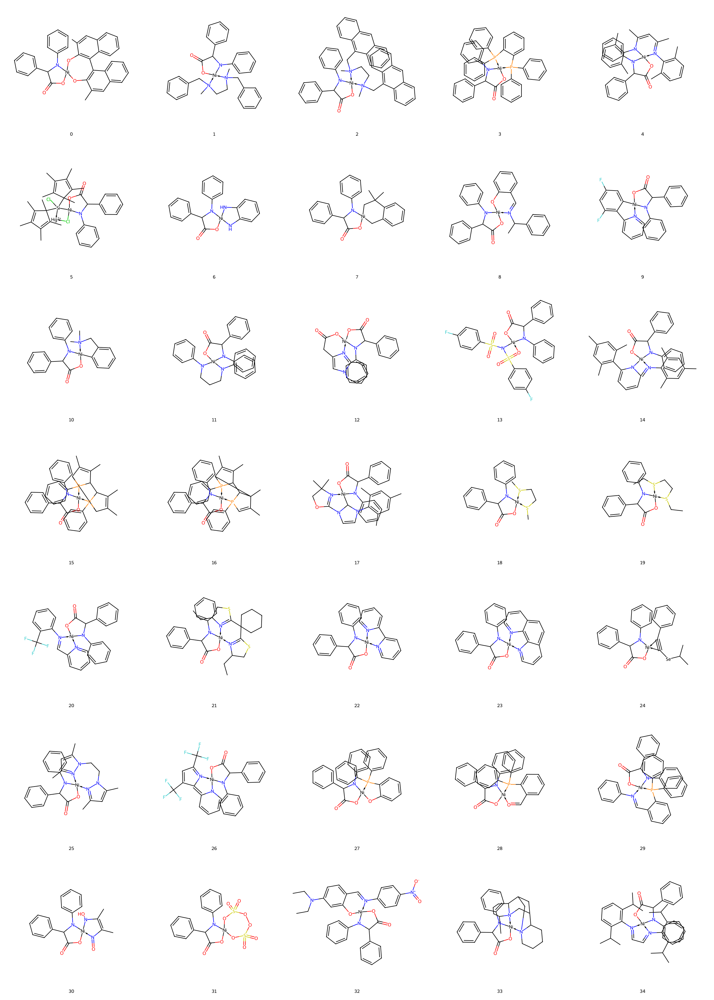

In [120]:
Chem.Draw.MolsToGridImage(mols[0:100], molsPerRow=5, subImgSize=(500,500), maxMols=35, legends=[f"{i}" for i in range(len(mols))])

In [ ]:
smiles = []
ms = []
for s in smiles_output:
    #print(s)
    try:
        m = Chem.MolFromSmiles(s)

        m2 = Chem.AddHs(m)

        Chem.SanitizeMol(m2)
        for atom in m2.GetAtoms():  
            atom.SetFormalCharge(0)
            atom.SetNumRadicalElectrons(0)        #Chem.SanitizeMol(m2)
        ms.append(m2)
    except:
        print("failed")
        continue
    for i, a in enumerate(m2.GetAtoms()):
        a.SetAtomMapNum(i+1)
    s = Chem.MolToSmiles(m2)
    smiles.append(s)

failed
failed
failed


[15:07:13] Explicit valence for atom # 9 Cl, 1, is greater than permitted
[15:07:13] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 11
[15:07:13] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8


In [ ]:
from TMC_embed.tmc_embed import embed_tmc_complex

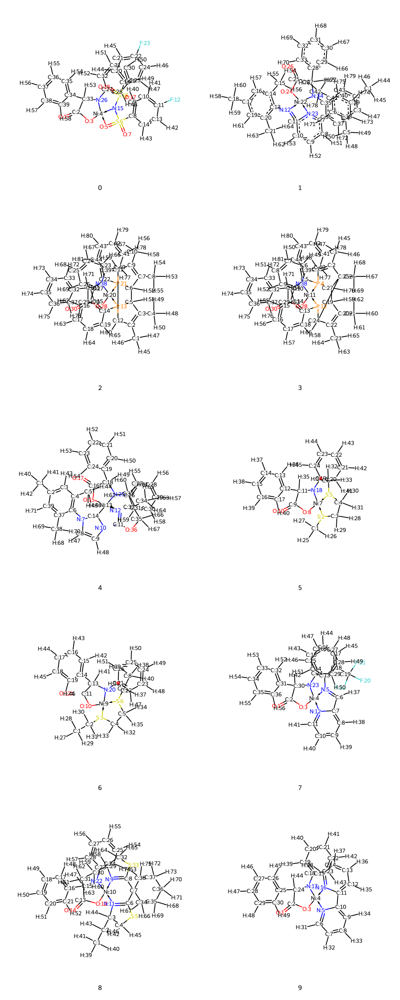

In [ ]:
Chem.Draw.MolsToGridImage(ms[10:20], molsPerRow=2, subImgSize=(500,500), maxMols=25, legends=[f"{i}" for i in range(len(output))])

In [ ]:
s2 = "[C:1]([c:2]1[c:3]([H:45])[c:4]([C:5]([H:46])([H:47])[H:48])[c:6]([N:7]2[C:8]([H:49])=[C:9]([H:50])[N:10]3[c:38]4[c-:30](->[Ni:12]5([C:11]23)[O:13][C:14](=[O:15])[C:16]([c:17]2[c:18]([H:52])[c:19]([H:53])[c:20]([H:54])[c:21]([H:55])[c:22]2[H:56])([H:51])[N:23]5[c:24]2[c:25]([H:57])[c:26]([H:58])[c:27]([H:59])[c:28]([H:60])[c:29]2[H:61])[c:31]([H:62])[n:32][c:33]([N:34]([C:35]([H:63])([H:64])[H:65])[C:36]([H:66])([H:67])[H:68])[n:37]4)[c:39]([C:40]([H:69])([H:70])[H:71])[c:41]1[H:72])([H:42])([H:43])[H:44]"

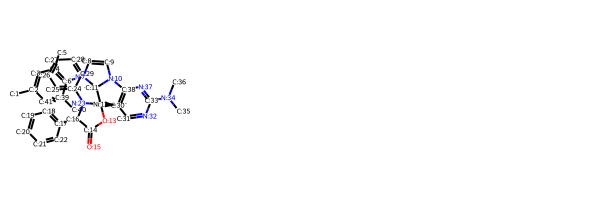

In [ ]:
c2 = Chem.MolFromSmiles(s2)
Chem.Draw.MolsToGridImage([c2])

In [ ]:
for atom in cc.GetAtoms():
    atom.SetAtomMapNum(0)

# Draw molecule
img = Chem.Draw.MolToImage(cc)
img.show()

In [ ]:
from TMC_embed.tmc_embed import get_tmc_mol, get_possible_coord_permutations

In [ ]:
smiles[3]

'[O:1]=[C:2]1[O:3][Ni:4]2([N:5]3[C:6]([H:40])=[C:7]([H:41])[C:8]([H:42])=[c:9]4[c:10]([H:43])[c:11]([N:12]([C:13](=[O:14])[C:15]([F:16])([F:17])[F:18])[H:44])[c:19]5[c:20]([c:21]43)[N:22]2[C:23]([H:45])=[C:24]([H:46])[C:25]=5[H:47])[N:26]([c:27]2[c:28]([H:48])[c:29]([H:49])[c:30]([H:50])[c:31]([H:51])[c:32]2[H:52])[C:33]1([c:34]1[c:35]([H:54])[c:36]([H:55])[c:37]([H:56])[c:38]([H:57])[c:39]1[H:58])[H:53]'

In [ ]:
smiles = pd.read_csv("/home/henryteahan/Projects/Orca_workflow/Automated/embed_results/nonamino/smiles_out.csv")

In [ ]:
smiles = smiles[smiles["smiles_0"] != str(-1)]
smiles.head(n=10)


,Unnamed: 0,ligand_ID,ligands,bind_site,smiles_0,smiles_1
0,0,0,Cc1cc2ccccc2c(-c2c([O-])c(C)cc3ccccc23)c1[O-],"[12, 13]",[C:1]([c:2]1[c:3]([H:46])[c:4]2[c:5]([H:47])[c...,[C:1]([c:2]1[c:3]([H:46])[c:4]2[c:5]([H:47])[c...
1,1,0,CN(CCN(C)Cc1ccccc1)Cc1ccccc1,"[0, 4]",[C:1]([N:2]1([C:3]([c:4]2[c:5]([H:44])[c:6]([H...,[C:1]([N:2]1([C:3]([c:4]2[c:5]([H:44])[c:6]([H...
2,2,2,CN(CCN(C)Cc1c2ccccc2cc2ccccc12)Cc1c2ccccc2cc2c...,"[1, 4]",[C:1]([N:2]1([C:3]([c:4]2[c:5]3[c:6]([H:60])[c...,[C:1]([N:2]1([C:3]([c:4]2[c:5]3[c:6]([H:60])[c...
3,3,12,c1ccc(P(c2ccccc2)c2ccccc2P(c2ccccc2)c2ccccc2)cc1,"[0, 19]",[O:1]=[C:2]1[O:3][Ni:4]2([N:5]([c:6]3[c:7]([H:...,[O:1]=[C:2]1[O:3][Ni:4]2([C:5]([c:6]3[c:7]([H:...
4,4,17,CC(=CC(C)=Nc1c(C)cccc1C)[N-]c1c(C)cccc1C,"[5, 14]",[C:1]([C:2]1=[C:3]([C:4]([C:5]([H:46])([H:47])...,[C:1]([C:2]1=[C:3]([C:4]([C:5]([H:46])([H:47])...
6,6,21,[NH-]c1ccccc1[NH-],"[0, 7]",[O:1]=[C:2]1[O:3][Ni:4]2(<-[N-:5]([c:6]3[c:7](...,[O:1]=[C:2]1[O:3][Ni:4]2(<-[N-:5]([c:6]3[c:7](...
7,7,22,[CH2-]c1ccccc1C([CH2-])(C)C,"[3, 4]",[C:1]([C:2]1([C:3]([H:33])([H:34])[H:35])[C-:4...,[C:1]([C:2]1([C:3]([H:33])([H:34])[H:35])[C-:4...
8,8,24,CC(N=Cc1ccccc1[O-])c1ccccc1,"[8, 16]",[C:1]([C:2]([c:3]1[c:4]([H:40])[c:5]([H:41])[c...,[C:1]([C:2]([c:3]1[c:4]([H:40])[c:5]([H:41])[c...
11,11,29,c1ccc([N-]CCC[N-]c2ccccc2)cc1,"[0, 4]",[O:1]=[C:2]1[O:3][Ni:4]2(<-[N-:19]([c:20]3[c:2...,[O:1]=[C:2]1[O:3][Ni:4]2(<-[N-:19]([c:20]3[c:2...
13,13,32,O=S(=O)([N-]S(=O)(=O)c1ccc(F)cc1)c1ccc(F)cc1,"[0, 10]",[O:1]=[C:2]1[O:3][Ni:4]2(<-[O:5]=[S:6](=[O:7])...,[O:1]=[C:2]1[O:3][Ni:4]2(<-[O:5]=[S:6](=[O:7])...


In [ ]:
smiles0 = smiles["smiles_0"]
smiles1 = smiles["smiles_1"]

In [ ]:
ms = []
for s0, s1 in zip(smiles0, smiles1):
    ms.append(Chem.MolFromSmiles(s0))
    ms.append(Chem.MolFromSmiles(s1))

/home/henryteahan/miniconda3/envs/orca/lib/python3.12/site-packages/rdkit/Chem/Draw/IPythonConsole.py:365: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


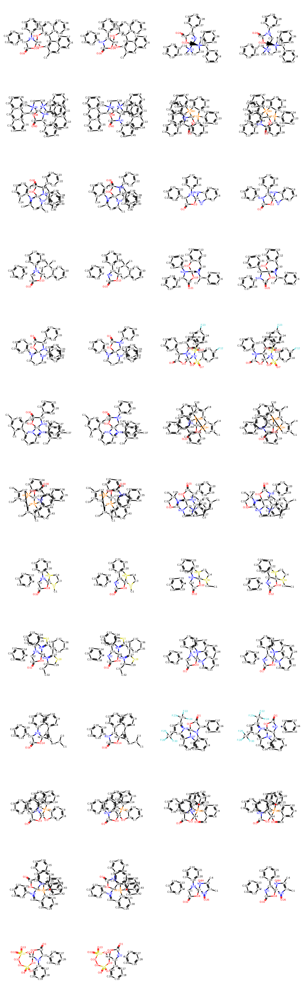

In [ ]:
Chem.Draw.MolsToGridImage(ms, molsPerRow=4)

In [ ]:
len(smiles['Complex'])

9842

In [ ]:

xtb_path = "/home/henryteahan/opt/xtb-6.7.1/xtb-dist/bin/xtb"
s = smiles[3]
possible_coord_orders = get_possible_coord_permutations(s)
stereo_confs = []
for coord_order in possible_coord_orders:
    mol = get_tmc_mol(s, xtb_path, coord_order=coord_order, N_tries=2)
    stereo_confs.append(mol)



KeyError: 3

In [ ]:
from TMC_embed.utils import draw3D

In [ ]:
draw3D(stereo_confs[2])

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

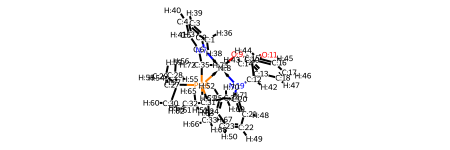

In [ ]:
stereo_confs[0]

In [ ]:
with open("/home/henryteahan/Projects/Orca_workflow/Automated/scripts/smiles_out_embed_2.xyz", "r") as f:
    text = f.read()

In [ ]:
EH_TO_KCAL = 627.5096080305927

In [ ]:
ensemble.energies

array([], dtype=float64)

In [ ]:
from prism_pruner.conformer_ensemble import ConformerEnsemble
from prism_pruner.pruner import prune

ensemble = ConformerEnsemble.from_xyz("/home/henryteahan/Projects/Orca_workflow/Automated/scripts/smiles_out_embed_74.xyz", read_energies=True)

print(ensemble.coords.shape) # (1086, 136, 3)
print(ensemble.energies)
pruned, mask = prune(
    ensemble.coords,
    ensemble.atoms,

    rot_corr_rmsd_pruning=True,
    debugfunction=print,
)

pruned.shape # (387, 136, 3)


(75, 72, 3)
[-115.14405715 -115.14405981 -115.15176611 -115.13327107 -115.144074
 -115.14408208 -115.13308865 -115.15140567 -115.14389335 -115.13309355
 -115.14408912 -115.14407505 -115.14407647 -115.14408398 -115.15140223
 -115.1440949  -115.15178459 -115.14408925 -115.15177379 -115.14387258
 -115.14407768 -115.14664984 -115.14409321 -115.1440642  -115.14405174
 -115.09090724 -115.04568148 -115.0567797  -115.06877549 -115.05453772
 -115.05324033 -115.05200434 -115.04264235 -115.04568177 -115.03510259
 -115.0587509  -115.05128771 -115.0435015  -115.05204432 -115.05875134
 -115.03284723 -115.11510758 -115.01854031 -115.05347366 -115.05204612
 -115.03576568 -115.1149026  -115.01858569 -115.0520462  -115.05128766
 -115.14290995 -115.13194165 -115.13194317 -115.1490058  -115.13315621
 -115.13194247 -115.14296554 -115.14593986 -115.1429097  -115.13200108
 -115.1319437  -115.14421488 -115.13194315 -115.14296545 -115.14290633
 -115.14759592 -115.13333459 -115.14296555 -115.13327156 -115.14589

(35, 72, 3)

In [ ]:
atoms = ensemble.atoms
coords = ensemble.coords[mask]
energies = ensemble.energies[mask]

In [ ]:
unique_E = energies*EH_TO_KCAL
mask_more = unique_E - unique_E.min() < 3 ### UNIQUE CONFORMERS WITHN 3 kcal / mol of the lowest!!!
mask_more

array([False, False,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,  True, False, False, False, False, False])

In [ ]:
ConformerEnsemble(coords[mask_more],atoms, energies[mask_more]).to_xyz("boom.xyz")

In [ ]:
ensemble.to_xyz()

TypeError: 'ConformerEnsemble' object is not subscriptable

In [ ]:
unique_E = ensemble.energies[mask]*EH_TO_KCAL
unique_E.min()
unique_E[unique_E - unique_E.min() < 3] ### UNIQUE CONFORMERS WITHN 3 kcal / mol of the lowest!!!
good = pruned[unique_E - unique_E.min() < 3] ### XYZ of conformers within 3kcal/mol of the lowest

AttributeError: 'numpy.ndarray' object has no attribute 'to_xyz'

USE BELOW LOGIC TO FIX the handling of multiple xyz files

In [ ]:
with open("/home/henryteahan/Projects/Orca_workflow/Automated/scripts/smiles_out_embed_14.xyzs", "r") as f:
    txt = f.read()

In [ ]:
txt

'72\n\nC     -3.61338200      3.08342400      6.44275800\nC     -2.73942700      1.98731500      5.91332200\nC     -1.74860400      2.27172100      4.98645900\nC     -0.89041200      1.28900700      4.51963800\nC      0.15387400      1.61676800      3.49427000\nC     -1.04341800     -0.01128300      5.00104100\nN     -0.19243000     -1.02919100      4.49591300\nC     -0.34374800     -1.48310600      3.20681100\nC      0.63057800     -2.39230800      2.97637600\nN      1.35058600     -2.46726500      4.13057000\nC      0.86165100     -1.63352600      5.09474400\nNi      1.79816400     -1.83270400      6.74060400\nO      2.73533100     -2.07417400      8.28262300\nC      2.11752700     -1.76217800      9.34383100\nO      2.51575200     -1.91080200     10.48735200\nC      0.69156800     -1.14328700      9.07069700\nC     -0.26729600     -2.27510100      9.25906700\nC     -0.21467900     -3.38638800      8.41822700\nC     -1.05376400     -4.46549400      8.61107000\nC     -1.96561700     -

In [ ]:
string.split("\n")

['']

In [ ]:
def split_xyz_blocks(txt):
    lines = txt.strip().splitlines()
    i = 0
    blocks = []

    while i < len(lines):
        natoms = int(lines[i])
        block_size = natoms + 2  # atom count + comment + coordinates

        block = "\n".join(lines[i:i + block_size])
        blocks.append(block)

        i += block_size

    return blocks


In [ ]:
bl = split_xyz_blocks(txt)

In [ ]:
bl[0][2:]

'\n\nC     -3.61338200      3.08342400      6.44275800\nC     -2.73942700      1.98731500      5.91332200\nC     -1.74860400      2.27172100      4.98645900\nC     -0.89041200      1.28900700      4.51963800\nC      0.15387400      1.61676800      3.49427000\nC     -1.04341800     -0.01128300      5.00104100\nN     -0.19243000     -1.02919100      4.49591300\nC     -0.34374800     -1.48310600      3.20681100\nC      0.63057800     -2.39230800      2.97637600\nN      1.35058600     -2.46726500      4.13057000\nC      0.86165100     -1.63352600      5.09474400\nNi      1.79816400     -1.83270400      6.74060400\nO      2.73533100     -2.07417400      8.28262300\nC      2.11752700     -1.76217800      9.34383100\nO      2.51575200     -1.91080200     10.48735200\nC      0.69156800     -1.14328700      9.07069700\nC     -0.26729600     -2.27510100      9.25906700\nC     -0.21467900     -3.38638800      8.41822700\nC     -1.05376400     -4.46549400      8.61107000\nC     -1.96561700     -4.

In [ ]:
new_xyz

[74]

In [ ]:
str.split

In [ ]:
txt[74:]

['72\n',
 '\n',
 'O      9.43793900      4.58882300     -0.12333200\n',
 'C      8.53313800      3.77813700     -0.11127100\n',
 'O      7.37681900      3.93729700      0.38090600\n',
 'Ni      6.13580100      2.71440500     -0.14189300\n',
 'N      4.72172500      3.82909000      0.26912000\n',
 'C      3.56411200      3.07513700      0.67628500\n',
 'C      3.64554800      2.44247700      2.05484500\n',
 'C      2.49647900      2.25636400      2.81371700\n',
 'C      2.55752400      1.61624400      4.03850700\n',
 'C      3.76934600      1.15784200      4.52552800\n',
 'C      4.92281000      1.35585600      3.78493400\n',
 'C      4.85949100      1.99898500      2.56276200\n',
 'C      3.45825200      1.95790100     -0.39970300\n',
 'C      2.55961400      0.81682900      0.00247800\n',
 'C      1.19543800      1.03608800      0.16108000\n',
 'C      0.35635100      0.00991600      0.55297600\n',
 'C      0.86864400     -1.25605400      0.78206200\n',
 'C      2.22034000     -1.4880